# Analysis and visualization of a public OKCupid profile dataset using python and pandas

Author: Alessandro Giusti ([web](http://www.idsia.ch/~giusti), [email](mailto://alessandrog@idsia.ch)), Dalle Molle Institute for Artificial Intelligence ([IDSIA](http://www.idsia.ch/)), [USI](http://www.usi.ch/)-[SUPSI](http://www.supsi.ch/)

## Introduction

This document is an analysis of a public dataset of almost 60000 online dating profiles.
The dataset has been [published](http://ww2.amstat.org/publications/jse/v23n2/kim.pdf) in the [Journal of Statistics Education](http://ww2.amstat.org/publications/jse/), Volume 23, Number 2 (2015) by Albert Y. Kim et al., and its collection and distribution was explicitly allowed by OkCupid president and co-founder [Christian Rudder](http://blog.okcupid.com/).  Using these data is therefore ethically and legally acceptable; this is in contrast to another recent release of a [different OkCupid profile dataset](http://www.vox.com/2016/5/12/11666116/70000-okcupid-users-data-release), which was collected without permission and without anonymizing the data (more on the ethical issues in [this Wired article](https://www.wired.com/2016/05/okcupid-study-reveals-perils-big-data-science/)).

### Notebook setup

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from IPython.display import display,HTML
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from prettypandas import PrettyPandas
sns.set_style("ticks")
sns.set_context(context="notebook",font_scale=1)

## Dataset details

The data is available at [this link](https://github.com/rudeboybert/JSE_OkCupid/blob/master/profiles.csv.zip).  The [codebook](https://github.com/rudeboybert/JSE_OkCupid/blob/master/okcupid_codebook.txt) includes many details about the available fields.  The dataset was collected by web scraping the [OKCupid.com](http://www.okcupid.com) website on 2012/06/30, and includes almost 60k profiles of people within a 25 mile radius of San Francisco, who were online in the previous year (after 06/30/2011), with at least one profile picture.


The CSV contains a row (observation) for each profile. Let's have a look at the first 10 profiles, excluding the columns whose name contains the string "essay", which contain a lot of text and are not practical at the moment.

In [2]:
d=pd.read_csv("profiles.csv/profiles.csv")
print("The dataset contains {} records".format(len(d)))

m=d[d["sex"]=="m"] # male users
f=d[d["sex"]=="f"] # female users
print("{} males ({:.1%}), {} females ({:.1%})".format(
    len(m),len(m)/len(d),
    len(f),len(f)/len(d)))

PrettyPandas(d                                   # Prettyprints pandas dataframes
    .head(10)                                    # Sample the first 10 rows
    [[c for c in d.columns if "essay" not in c]] # Ignore columns with "essay" in the name (they are long)
)

The dataset contains 59946 records
35829 males (59.8%), 24117 females (40.2%)


The dataset contains many interesting information about the individual users, but this is just a fraction of the data that OKCupid has collected.  The OKCupid data team reports in the [OKTrends blog](https://blog.okcupid.com/) insightful (and entertaining) studies which make use of additional information such as for example: 
- the users' [interactions](https://blog.okcupid.com/index.php/the-biggest-lies-in-online-dating/), i.e. who messaged/liked whom;
- [profile pictures](https://blog.okcupid.com/index.php/the-mathematics-of-beauty/) and their [metadata](https://blog.okcupid.com/index.php/dont-be-ugly-by-accident/));
- answers to the [profiling](https://blog.okcupid.com/index.php/the-best-questions-for-first-dates/) [questions](https://blog.okcupid.com/index.php/race-attraction-2009-2014/) OKCupid uses to compute the match ratings.

## Age distribution

In [3]:
print("Age statistics:\n{}".format(d["age"].describe()))
print()
print("There are {} users older than 80".format((d["age"]>80).sum()))

Age statistics:
count    59946.000000
mean        32.340290
std          9.452779
min         18.000000
25%         26.000000
50%         30.000000
75%         37.000000
max        110.000000
Name: age, dtype: float64

There are 2 users older than 80


### Find the age outliers

Apparently we have one 110-year-old user, and only another one over-80.  They might be outliers, let's have a look at their data.

In [4]:
PrettyPandas(d[d["age"]>80])

Let's assume the 110-year-old lady and the athletic 109-year-old gentleman (who's working on a masters program) are outliers: we get rid of them so the following plots look better.  They didn't say much else about themselves, anyway.

In [5]:
d=d[d["age"]<=80] # sorry guys

print("The dataset now contains {} records".format(len(d)))

m=d[d["sex"]=="m"] # male users
f=d[d["sex"]=="f"] # female users
print("{} males ({:.1%}), {} females ({:.1%})".format(
    len(m),len(m)/len(d),
    len(f),len(f)/len(d)))

print()
print("Age statistics:\n{}".format(d["age"].describe()))

The dataset now contains 59944 records
35828 males (59.8%), 24116 females (40.2%)

Age statistics:
count    59944.000000
mean        32.337715
std          9.442423
min         18.000000
25%         26.000000
50%         30.000000
75%         37.000000
max         69.000000
Name: age, dtype: float64


### Draw age histograms for male and female users

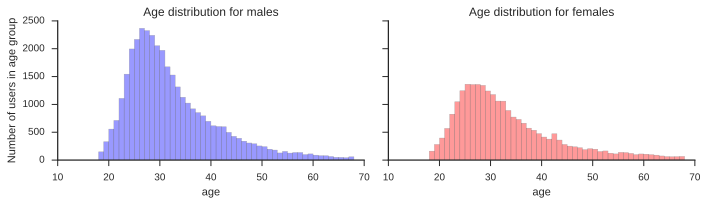

In [6]:
fig,(ax1,ax2) = plt.subplots(ncols=2,figsize=(10,3),sharey=True,sharex=True)
sns.distplot(m["age"], ax=ax1,
             bins=range(d["age"].min(),d["age"].max()),
             kde=False,
             color="b")
ax1.set_title("Age distribution for males")
sns.distplot(f["age"], ax=ax2,
             bins=range(d["age"].min(),d["age"].max()),
             kde=False,
             color="r")
ax2.set_title("Age distribution for females")
ax1.set_ylabel("Number of users in age group")
for ax in (ax1,ax2):
    sns.despine(ax=ax)
fig.tight_layout()

Note that both distributions are [right-skewed](https://en.wikipedia.org/wiki/Skewness).  Then, as is often (but [not always](http://ww2.amstat.org/publications/jse/v13n2/vonhippel.html)!) the case, the mean is larger than the median.

In [7]:
print("Mean and median age for males:   {:.2f}, {:.2f}".format(m["age"].mean(),m["age"].median()))
print("Mean and median age for females: {:.2f}, {:.2f}".format(f["age"].mean(),f["age"].median()))

Mean and median age for males:   32.02, 30.00
Mean and median age for females: 32.82, 30.00


Females seem to be on average slightly older than males.  Let's compare the age distributions in a single plot

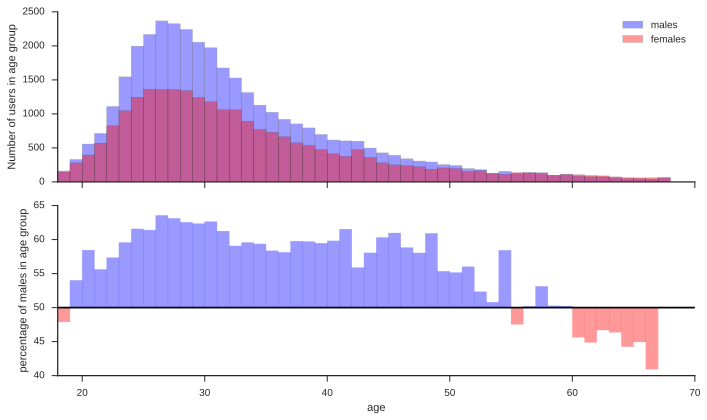

In [8]:
fig,(ax1,ax2) = plt.subplots(nrows=2,figsize=(10,6),sharex=True)

# Plot the age distributions of males and females on the same axis
sns.distplot(m["age"], ax=ax1,
             bins=range(d["age"].min(),d["age"].max()),
             kde=False,
             color="b",
             label="males")
sns.distplot(f["age"], ax=ax1,
             bins=range(d["age"].min(),d["age"].max()),
             kde=False,
             color="r",
             label="females")
ax1.set_ylabel("Number of users in age group")
ax1.set_xlabel("")
ax1.legend()

# Compute the fraction of males for every age value
fraction_of_males=(m["age"].value_counts()/d["age"].value_counts())
# Ignore values computed from age groups in which we have less than 100 total users (else estimates are too unstable)
fraction_of_males[d["age"].value_counts()<100]=None
barlist=ax2.bar(left=fraction_of_males.index,
        height=fraction_of_males*100-50,
        bottom=50, width=1, color="gray")
for bar,frac in zip(barlist,fraction_of_males):
    bar.set_color("b" if frac>.5 else "r")
    bar.set_alpha(0.4)
ax2.set_xlim([18,70])
ax2.set_xlabel("age")
ax2.set_ylabel("percentage of males in age group")
ax2.axhline(y=50,color="k")

for ax in (ax1,ax2):
    sns.despine(ax=ax)
fig.tight_layout()


Over-60 users are not many, but in this group there are significantly more females than males.  This may be explained by the fact that, in this age group, there are more females than males in the general population.

![USA by Sex and Age 2015-07-01](https://upload.wikimedia.org/wikipedia/commons/thumb/0/03/USA_by_Sex_and_Age_2015-07-01.svg/512px-USA_by_Sex_and_Age_2015-07-01.svg.png)
[Picture](https://commons.wikimedia.org/wiki/File%3AUSA_by_Sex_and_Age_2015-07-01.svg) By Delphi234 (Own work) [CC0], via [Wikimedia Commons](https://commons.wikimedia.org).

On this topic, also see page 5 of the [2010 US Census Brief on Age and Sex Composition](http://www.census.gov/prod/cen2010/briefs/c2010br-03.pdf).  The ratio between males and females in a given population is called [Sex Ratio](https://en.wikipedia.org/wiki/Sex_ratio).

## Study height distribution and compare with official data from the US Centers of Disease Control and Prevention ([CDC](https://www.cdc.gov/))

We first plot the height distribution for males and females in the whole dataset

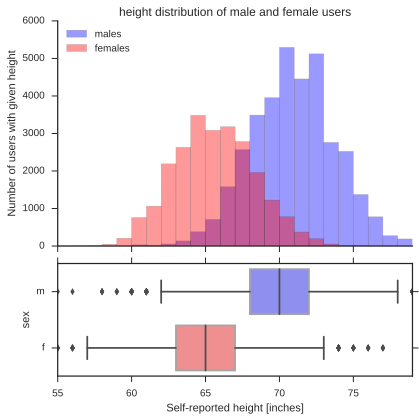

In [9]:
fig,(ax,ax2) = plt.subplots(nrows=2,sharex=True,figsize=(6,6),gridspec_kw={'height_ratios':[2,1]})

# Plot histograms of height
bins=range(55,80)
sns.distplot(m["height"].dropna(), ax=ax,
             bins=bins,
             kde=False,
             color="b",
             label="males")
sns.distplot(f["height"].dropna(), ax=ax,
             bins=bins,
             kde=False,
             color="r",
             label="females")
ax.legend(loc="upper left")
ax.set_xlabel("")
ax.set_ylabel("Number of users with given height")
ax.set_title("height distribution of male and female users");

# Make aligned boxplots
sns.boxplot(data=d,y="sex",x="height",orient="h",ax=ax2,palette={"m":"b","f":"r"})
plt.setp(ax2.artists, alpha=.5)
ax2.set_xlim([min(bins),max(bins)])
ax2.set_xlabel("Self-reported height [inches]")

sns.despine(ax=ax)
fig.tight_layout()

Males are obviously taller than females, and the two distributions make sense.

How does this compare with general population data?  Are OkCupid users maybe cheating and overreporting their height?

The CDC publishes [growth charts](https://www.cdc.gov/growthcharts/), which contain height data for the general US population.  The dataset reports statistics (3rd, 5th, 10th, 25th, 50th, 75th, 90th, 95th, 97th percentiles) for stature for different ages from 2 to 20 years.  This (and more) data is plotted by the CDC in [these beautiful charts](https://www.cdc.gov/growthcharts/data/set2clinical/set2color.pdf).

In [10]:
# Import a CSV file for growth chart data
cdc=pd.read_csv("https://www.cdc.gov/growthcharts/data/zscore/statage.csv")

print("First 10 rows of raw cdc growth chart data")
display(PrettyPandas(cdc.head(10)))

First 10 rows of raw cdc growth chart data


In [11]:
# Adjust the data to fit our format
cdc["Age"]=cdc["Agemos"]/12 # convert age in months to age in fractional years
cdc["Sex"]=cdc["Sex"].replace({1:"m",2:"f"}) # align to our convention
percentiles=[3,5,10,25,50,75,90,95,97]
percentile_columns=["P"+str(p) for p in percentiles] # names of percentile columns
cdc[percentile_columns]=cdc[percentile_columns]*0.393701 # convert percentile columns from centimeters to inches (ugh)
cdc20=cdc[cdc["Age"]==20].set_index("Sex") # Select the two rows corresponding to 20-year-olds (males and females)

print("Height Percentiles for 20-year-old US population [inches]")
display(PrettyPandas(cdc20[percentile_columns],precision=4))

Height Percentiles for 20-year-old US population [inches]


Let's compare the stats for reported heights of our 20-year-olds to the CDC stats for 20-year-olds.

Note that OKCupid height data are integers, which also causes all percentiles to be integer values.
To fix this, we jitter the data by $\pm0.5$ inches by adding random uniformly distributed noise in the range $[-0.5,+0.5]$ (which won't affect the mean, but will smooth the percentiles).  This makes sense if we assume that users reported their height rounded to the nearest inch.

In [12]:
mheights=m.loc[m["age"]==20,"height"] # heights of 20-year-old males
fheights=f.loc[f["age"]==20,"height"] # heights of 20-year-old females

# To smooth the computation of percentiles, jitter height data by adding
# uniformly distributed noise in the range [-0.5,+0.5]
mheightsj=mheights+np.random.uniform(low=-0.5,high=+0.5,size=(len(mheights),))
fheightsj=fheights+np.random.uniform(low=-0.5,high=+0.5,size=(len(fheights),))

# For each of the available percentiles in CDC data, compute the corresponding percentile from our 20-year-old users
stats=[]
for percentile,percentile_column in zip(percentiles,percentile_columns):
    stats.append({"sex":"m",
                  "percentile":percentile,
                  "CDC":cdc20.loc["m",percentile_column],
                  "users":mheightsj.quantile(percentile/100)})
    stats.append({"sex":"f",
                  "percentile":percentile,
                  "CDC":cdc20.loc["f",percentile_column],
                  "users":fheightsj.quantile(percentile/100)})
stats=pd.DataFrame(stats).set_index(["sex","percentile"]).sort_index()

# For each percentile, compute the gap between users and CDC
stats["gap"]=stats["users"]-stats["CDC"]

print("Height percentiles (in inches) for 20-year-old males")
display(PrettyPandas(stats.loc["m"],precision=4))

print("Height percentiles (in inches) for 20-year-old females")
display(PrettyPandas(stats.loc["f"],precision=4))

Height percentiles (in inches) for 20-year-old males


Height percentiles (in inches) for 20-year-old females


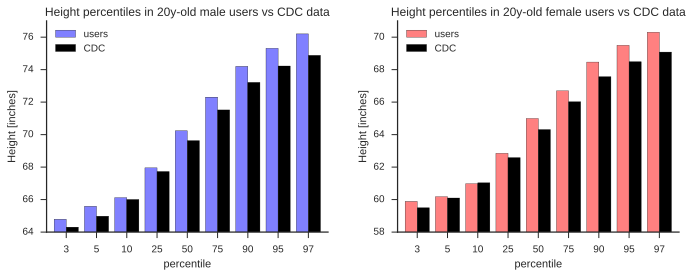

In [13]:
fig,(ax1,ax2)=plt.subplots(ncols=2,sharex=True,figsize=(10,4))
stats.loc["m"][["users","CDC"]].plot.bar(ax=ax1,color=[[0.5,0.5,1],"k"],alpha=1,width=0.8,rot=0)
stats.loc["f"][["users","CDC"]].plot.bar(ax=ax2,color=[[1,0.5,0.5],"k"],alpha=1,width=0.8,rot=0)
ax1.set_ylim([64,77])
ax2.set_ylim([58,71])
ax1.set_ylabel("Height [inches]")
ax2.set_ylabel("Height [inches]")
ax1.set_title("Height percentiles in 20y-old male users vs CDC data")
ax2.set_title("Height percentiles in 20y-old female users vs CDC data")
for ax in (ax1,ax2):
    sns.despine(ax=ax)
fig.tight_layout()

The height statistics of our user population matches remarkably well with CDC data.
It looks like our users, males and females alike, may be slightly over-reporting their height (still, much less than one could expect), but there could be many other reasonable explanations for this gap. For example, the San-Francisco population may be taller than the general US population.  [This](http://opendata.stackexchange.com/questions/4683/average-height-of-males-and-females-for-each-of-the-50-us-states-where-can-i-do) might be a starting point to further investigate the issue.  

Another explanation may be that short users are more likely to not report their height; in this case, even though other users report their height honestly, our statistics (which ignores missing values) would be biased.  This problem is well known to statisticians as [data missing not at random](https://en.wikipedia.org/wiki/Missing_data#Missing_not_at_random) (MNAR).  May we be victims of this?

In [14]:
d["height"].isnull().sum()

3

Apparently not, as we only have 3 users with missing height data, which could never explain the gap.  Probably, height is a required information to sign up.  The reason why a few users are missing this is unknown (maybe they signed up when the information was not compulsory?)

Note that [this analysis](https://blog.okcupid.com/index.php/the-biggest-lies-in-online-dating/) on the whole population of OKCupid users found a larger tendency to height exaggeration.

## Study how height changes with age
All our users are over-18. As shown in [CDC plots](https://www.cdc.gov/growthcharts/data/set2clinical/set2color.pdf), height does not increase much after 18, but we can still observe the very last stage of growth, just by fractions of an inch. 

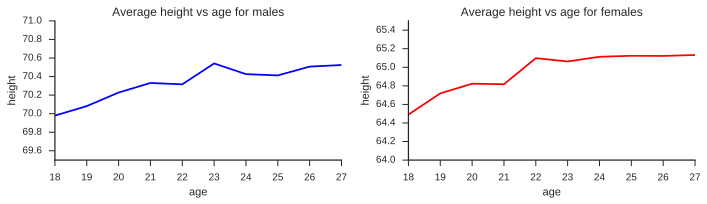

In [15]:
#%% Investigate heights vs sex vs age
g=d.groupby(["sex","age"])["height"].mean()
fig,(ax1,ax2)=plt.subplots(ncols=2,sharex=True,figsize=(10,3))
ax1.plot(g["m"],color="b")
ax1.set_xlim(18,27)
ax1.set_ylim(69.5,71)
ax1.set(title="Average height vs age for males",
        ylabel="height",
        xlabel="age")
ax2.plot(g["f"],color="r")
ax2.set_xlim(18,27)
ax2.set_ylim(64,65.5)
ax2.set(title="Average height vs age for females",
        ylabel="height",
        xlabel="age");
for ax in (ax1,ax2):
    sns.despine(ax=ax)
fig.tight_layout()

We can also overlay CDC growth charts to the above plots, with minimal [data wrangling](https://en.wikipedia.org/wiki/Data_wrangling).

We only have to massage our cdc data so that it is indexed by age (in integer years).  For a given integer age (say 19 years) the original data has 12 rows corresponding to the ages of $(19 \cdot 12 + 0), (19 \cdot 12 + 1), \cdots, (19 \cdot 12 + 11)$ months. For a given integer age we average the corresponding percentiles of each of these rows.

In [16]:
cdc_m=cdc[cdc["Sex"]=="m"].groupby(np.floor(cdc["Age"]))[percentile_columns].mean()
cdc_f=cdc[cdc["Sex"]=="f"].groupby(np.floor(cdc["Age"]))[percentile_columns].mean()

# Result for males
display(PrettyPandas(cdc_m,precision=4))

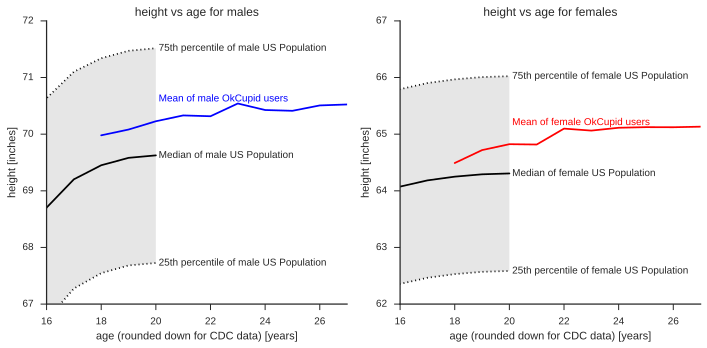

In [17]:
# Compute average height per sex and age
g=d.groupby(["sex","age"])["height"].mean()

fig,(ax1,ax2)=plt.subplots(ncols=2,sharex=True,figsize=(10,5))
ax1.plot(g["m"],color="b",label="Mean of male OkCupid users")
ax1.plot(cdc_m["P75"],color="k",linestyle='dotted',label="75th percentile of male US Population")
ax1.plot(cdc_m["P50"],color="k",label="Median of male US Population")
ax1.plot(cdc_m["P25"],color="k",linestyle='dotted',label="25th percentile of male US Population")
ax1.fill_between(cdc_m.index,cdc_m["P25"],cdc_m["P75"],color="k",alpha=0.1,linewidth=0)


#ax1.legend(loc="lower right")
# Use direct labeling instead of a legend
x=cdc_m["P50"].index[-1]
ax1.text(x, g["m"].loc[:26].max(), " Mean of male OkCupid users", color="b",
         verticalalignment="bottom",fontsize="small")
ax1.text(x, cdc_m["P75"].iloc[-1]," 75th percentile of male US Population",
         verticalalignment="center",fontsize="small")
ax1.text(x, cdc_m["P50"].iloc[-1]," Median of male US Population",
         verticalalignment="center",fontsize="small")
ax1.text(x, cdc_m["P25"].iloc[-1]," 25th percentile of male US Population",
         verticalalignment="center",fontsize="small")

ax1.set_xlim(16,27)
ax1.set_ylim(67,72)
ax1.set(title="height vs age for males",
        ylabel="height [inches]",
        xlabel="age (rounded down for CDC data) [years]");
ax2.plot(g["f"],color="r",label="Mean of female OkCupid users")
ax2.plot(cdc_f["P75"],color="k",linestyle='dotted',label="75th percentile of female US Population")
ax2.plot(cdc_f["P50"],color="k",label="Median of female US Population")
ax2.plot(cdc_f["P25"],color="k",linestyle='dotted',label="25th percentile of female US Population")
ax2.fill_between(cdc_f.index,cdc_f["P25"],cdc_f["P75"],color="k",alpha=0.1,linewidth=0)

#ax2.legend(loc="lower right")
# Use direct labeling instead of a legend
x=cdc_f["P50"].index[-1]
ax2.text(x, g["f"].loc[:26].max(), " Mean of female OkCupid users", color="r",
         verticalalignment="bottom",fontsize="small")
ax2.text(x, cdc_f["P75"].iloc[-1]," 75th percentile of female US Population",
         verticalalignment="center",fontsize="small")
ax2.text(x, cdc_f["P50"].iloc[-1]," Median of female US Population",
         verticalalignment="center",fontsize="small")
ax2.text(x, cdc_f["P25"].iloc[-1]," 25th percentile of female US Population",
         verticalalignment="center",fontsize="small")

ax2.set_xlim(16,27)
ax2.set_ylim(62,67)
ax2.set(title="height vs age for females",
        ylabel="height [inches]",
        xlabel="age (rounded down for CDC data) [years]");
for ax in (ax1,ax2):
    sns.despine(ax=ax)
fig.tight_layout()

## How do users self-report their body type?
An interesting categorical attribute `body_type` contains the self-reported body type of the user, chosen from a limited set of options.

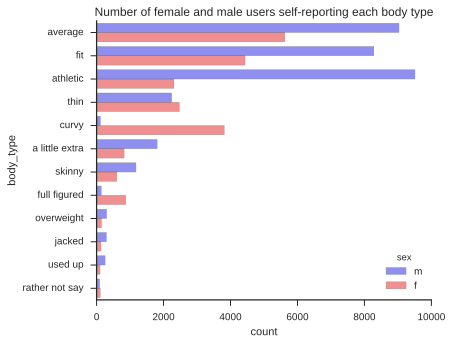

In [18]:
fig,ax=plt.subplots(figsize=(6,5))
sns.countplot(y="body_type",hue="sex",
              order=d["body_type"].value_counts().sort_values(ascending=False).index,
              data=d,palette={"m":"b","f":"r"},alpha=0.5,ax=ax);
ax.set_title("Number of female and male users self-reporting each body type")
sns.despine(ax=ax)

In the plot above, males and females are two sub-groups of the population, whereas `body_type` is a categorical attribute. It is interesting to compare how users in each of the two sub-groups (i.e. males and females) are likely to use each of the available categorical values;  this is normally done through [contingency tables](https://en.wikipedia.org/wiki/Contingency_table).

For example, regardless of how frequent these body types are in the general population, it's interesting to note that the terms *curvy* and *full figured* are disproportionally used by females, whereas *a little extra* is mostly used by males.

The function implemented below aims to visualize this, for a generic categorical attribute and a generic grouping of users.  It accpets the following inputs:
- a series with categorical data (in the example, the self-reported body type of each user)
- two like-indexed boolean series `g1` and `g2` defining two subgroups of the population (in the example, whether each user is a male (`True` in `g1`) or a female (`True` in `g2`)).  Note that, even though it is the case in the example, the two groups don't need to define partition of the population: they may intersect (an user may be in both `g1` and `g2`) and they may not cover the whole population (an user may be in neither `g1` nor `g2`).  We also expect that the two subgroups may have very different sizes.
- The function also accepts readable names and RGB (or matplotlib) colors assigned to each of the two groups.

For each unique value of `series` represented in the union of the two groups, the function visualizes how frequently the value is used by group `g1` compared to how frequently it is used by group `g2`.  We expect the output to be $0.5$ for values that were equally frequent in `g1` and `g2` (note that, since we deal with frequencies, this does not depend on the relative sizes of `g1` and `g2`, nor on whether the frequency in both groups is very low or very high); we expect the output to be $0$ for values that were only seen in `g2` and never seen in `g1`; we expect the output to be $1$ for values that were only seen in `g1` and never seen in `g2`.

The function automatically discards values that appear less than 50 total times in the two groups, which would yield an unreliable estimate of the proportion.

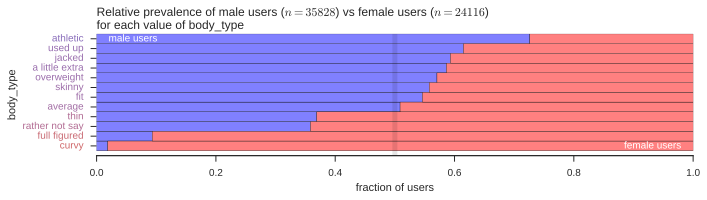

In [19]:
import math

# Define visualization function
def compare_prevalence(series,g1,g2,g1name,g2name,g1color,g2color,ax):
    
    # for each categorical value represented in series, number of users in group g1 which have this value
    g1n=series.loc[g1].value_counts()
    # for each categorical value represented in series, number of users in group g2 which have this value
    g2n=series.loc[g2].value_counts()
    
    # join the two series in a single dataframe, filling 0 where indices don't match
    # (e.g. if a value represented in g1 did never appear in g2)
    df=pd.concat({"g1n":g1n,"g2n":g2n},axis=1).fillna(0)
    # df has one row for every distinct value of series in the union of g1 and g2
    
    # normalize the data
    df["g1f"]=df["g1n"]/(df["g1n"].sum()) # fraction of g1 users with each categorical value
    df["g2f"]=df["g2n"]/(df["g2n"].sum()) # fraction of g2 users with each categorical value
    
    assert(math.isclose(df["g1f"].sum(),1)) 
    assert(math.isclose(df["g2f"].sum(),1))
    
    # for each row of df, we now compute how frequent the value was in g1 compared to the frequency it had in g2.
    df["frac12"]=df["g1f"]/(df["g1f"]+df["g2f"])
    # we expect df["frac12"] to be 0.5 for values that were equally frequent in g1 and g2 (note that this does not depend on the size of g1 and g2)
    # we expect df["frac12"] to be 0 for values that were only seen in g2 and never seen in g1
    # we expect df["frac12"] to be 1 for values that were only seen in g1 and never seen in g2
    
    df=df[(df["g1n"]+df["g2n"])>=50] # exclude values which are too rare
    df=df.sort_values("frac12")
    
    # Draw the left bars
    ax.barh(bottom=range(len(df)),
                width=df["frac12"],
                left=0,
                height=1,
                align="center",
                color=g1color,alpha=1)
    # Draw the right bars
    ax.barh(bottom=range(len(df)),
                width=df["frac12"]-1,
                left=1,
                height=1,
                align="center",
                color=g2color,alpha=1)
    
    # Draw a faint vertical line for x=0.5
    ax.axvline(x=0.5,color="k",alpha=0.1,linewidth=5)
    ax.set(xlim=[0,1],
           ylim=[-1,len(df)-0.5],
           yticks=range(len(df)),
           yticklabels=df.index,
           xlabel="fraction of users",
           ylabel=series.name)
    
    ax.set_title("Relative prevalence of {} ($n={}$) vs {} ($n={}$)\nfor each value of {}".format(
                g1name,g1.sum(),g2name,g2.sum(),series.name),
                loc="left",fontdict={"fontsize":"medium"})
    ax.text(0.02,len(df)-1,g1name,verticalalignment="center",horizontalalignment="left",size="smaller",color="w")
    ax.text(0.98,0,g2name,verticalalignment="center",horizontalalignment="right",size="smaller",color="w")

    def color_for_frac(f):
        # Blend g1color and g2color according to f (convex linear combination):
        # 0 returns g1color, 1 returns g2color)
        ret=np.array(g1color)*f+np.array(g2color)*(1-f)
        if(np.linalg.norm(ret)>1):          # If the resulting rgb color is too bright for text,
            ret=(ret/np.linalg.norm(ret))*1 # rescale its brightness to dark (but keep hue)
        return ret
        
    for i,tl in enumerate(plt.gca().get_yticklabels()):
        tl.set_color(color_for_frac(df["frac12"].iloc[i]))
        
    sns.despine(ax=ax,left=True)

# Apply visualization function 
fig,ax = plt.subplots(figsize=(10,3))
compare_prevalence(
    series=d["body_type"],                          # Which categorical attribute?
    g1=d["sex"]=="m",      g2=d["sex"]=="f",        # Definition of the two groups
    g1name="male users",   g2name="female users",   # Names of the two groups
    g1color=[0.5,0.5,1.0], g2color=[1.0,0.5,0.5],   # Colors for the two groups
    ax=ax)
fig.tight_layout()


The plot above can be interpreted as follows.  If we sample the same number of males and females from the population, and then we only keep those who describe themselves as "athletic", almost 73% of these will be male, and the remaining 27% will be female.

Similarly, if we consider users who describe themselves as "curvy", more than 98% of these will be female.

Note that the fractions do not depend on the prevalence of the two groups in the overall population, nor on the prevalence of each categorical body type value in the general population.  We can therefore apply the same function to other group pairs, even when the two groups have very different sizes.

This plot is a less expressive variant of a well-known representation of contingency tables called [*mosaic plot*](http://statmath.wu.ac.at/projects/vcd/), and closely resembles what [here](http://photo.etangkk.com/Python/blog-03.asp) is called *relative frequency segmented bar plot*.

## Study categorical attributes for different segments of the population
i.e., make a lot of plots like the one above, for different attributes and using different groupings.

### Define a list of interesting group pairs

We now define a large amount of interesting pairs of groups that we want to compare.  For each group in each pair, we define:
- the human-readable name of the group;
- an RGB color to represent the group (because [eyecandy](http://news.nationalgeographic.com/2015/09/150922-data-points-visualization-eye-candy-efficiency/));
- a boolean series indexed like `d`, which masks the users belonging to the group

In [20]:
groupss=[            #   Color RGB      Boolean series to index observations in d
    (("male users",      [0.5,0.5,1.0], d["sex"]=="m"),
     ("female users",    [1.0,0.5,0.5], d["sex"]=="f")),
    
    (("straight users",  [0.5,0.5,0.5], d["orientation"]=="straight"),
     ("gay/bi users",    [0.7,0.7,0.1], d["orientation"]!="straight")),
    
    (("young users",     [0.4,0.8,0.4], d["age"]<25),
     ("older users",     [0.4,0.4,0.5], d["age"]>35)),
    
    (("earns_little",    [0.4,0.4,0.4], d["income"]==20000),
     ("earns_alot",      [0.4,0.9,0.6], d["income"]>=50000)),
    # We purposefully exclude users not reporting their income (i.e.the majority). 20k is the lowest available tier
    # We also purposefully exclude intermediate tiers
    
    (("fit users",       [0.4,0.6,0.8], d["body_type"].isin(["average","fit","athletic","thin","skinny","jacked"])),
     ("unfit users",     [0.8,0.6,0.4], d["body_type"].isin(["a little extra","curvy","full figured","rather not say","overweight"]))),
    # We assume that users that do not say their body_type are unfit
    
    (("monoglots",       [0.7,0.7,0.7], d["speaks"].str.count(",")==0),
     ("polyglots",       [0.5,0.5,0.5], d["speaks"].str.count(",")>=2)),
   
    (("witty_programmers",     [0.4,0.7,0.4], d["speaks"].str.contains("\\b(?:c|lisp)\\b",na=False)),
     ("non witty_programmers", [0.5,0.5,0.6], ~(d["speaks"].str.contains("\\b(?:c|lisp)\\b",na=True)))),
    # a "witty programmer" is a nerd who, when asked which languages she/he speaks, thinks that "C++" or "perl" are reasonable answers.
    # in their defence, these are valid options in the okcupid interface (see codebook)
    # we compare them with everyone else (i.e. people who are probably not as nerd)

    (("it_lang_speakers",      [0.5,0.7,0.5], d["speaks"].str.contains("\\b(?:italian)\\b",na=False)),
     ("non it_lang_speakers",  [0.5,0.5,0.5], ~(d["speaks"].str.contains("\\b(?:italian)\\b",na=True)))),
   
    (("dead_lang_speakers",    [0.5,0.7,0.5], d["speaks"].str.contains("\\b(?:latin|ancient greek)\\b",na=False)),
     ("non dead_lang_speakers",[0.5,0.5,0.5], ~(d["speaks"].str.contains("\\b(?:latin|ancient greek)\\b",na=True)))),
    # a "dead_lang_speaker" is a nerd who, when asked which languages she/he speaks, thinks that "latin" or "ancient greek" are reasonable answers.
    # in their defence, these are valid options in the okcupid interface (see codebook)
    # we compare them with everyone else (i.e. people who are probably not as nerd)
    
    (("nonsmokers",      [0.6,0.6,1.0], d["smokes"]=="no"),
     ("smokers",         [0.3,0.3,0.3], d["smokes"]=="yes")),
    
    (("omnivores",       [0.8,0.4,0.4], d["diet"].str.split().str.get(-1).str.contains("anything",na=False)),
     ("veg(etari)ans",   [0.3,0.8,0.3], d["diet"].str.split().str.get(-1).str.contains("veg",na=False))),
   
    (("doesnt_want_kids",[0.4,0.4,0.4], d["offspring"].isin(["doesn&rsquo;t want kids","doesn&rsquo;t have kids, and doesn&rsquo;t want any"])),
     ("wants_kids",      [0.4,0.8,0.8], d["offspring"].isin(["doesn&rsquo;t have kids, but wants them","wants kids","has a kid, and wants more","has kids, and wants more"]))),
    # We sample the possible answers to the "offspring" question identifying those that explicitly say they want (more) kids
    # vs those that explicitly say they don't, regardless of whether they already have kids or not.
    
    (("cat lovers",      [1.0,0.6,0.6], d["pets"].str.contains("\\b(?:likes|has) cats",na=False)),
     ("cat haters",      [0.4,0.4,0.4], d["pets"].str.contains("\\bdislikes cats",na=False))),
    # A cat lover either has or likes cats; a cat hater dislikes cats.
   
    (("dog lovers",      [1.0,0.6,0.6], d["pets"].str.contains("\\b(?:likes|has) dogs",na=False)),
     ("dog haters",      [0.4,0.4,0.4], d["pets"].str.contains("\\bdislikes dogs",na=False)))
    # A dog lover either has or likes dogs; a dog hater dislikes dogs.
]


# We finally add a couple of religion_based groupings
atheists = d["religion"].str.contains("\\b(?:atheism|agnosticism)\\b").fillna(False)
religious = ~(d["religion"].str.contains("\\b(?:atheism|agnosticism)\\b").fillna(True))
religion_not_important = religious & d["religion"].str.contains(
    "\\b(?:but not too serious about it|and laughing about it)\\b").fillna(False)
religion_important = religious & d["religion"].str.contains(
    "\\b(?:and somewhat serious about it|and very serious about it)\\b").fillna(False)

groupss+=[
    (("atheists/agnostics", [0.4,0.5,0.4], atheists),
     ("religious",          [0.4,0.4,0.5], religious)),
    (("serious_religious",  [0.4,0.3,0.3], religion_important),
     ("laughing_religious", [0.6,0.6,0.5], religion_not_important))]

### Define a list of interesting categorical attributes
Body type is not the only interesting categorical attribute. Below we add this and other attributes in a list, possibly after massaging the data in order to limit the amount of categories in each attribute.

Note that the name of each series is used to label the plots.

In [21]:
attrs=[]

attrs.append(d["body_type"])

attrs.append(d["job"])

location=d["location"].copy()
users_per_location=location.value_counts()
location.loc[~(location.isin(list(users_per_location[users_per_location>1000].index)))]="elsewhere"
attrs.append(location)
# There are too many unique locations; we rewrite all locations that appear less than 1k times as "elsewhere".

attrs.append(d["orientation"])

attrs.append(d["drinks"])
# Has potentially interesting categories beyond yes and no, like "desperately".

attrs.append(d["education"].str.replace("working on ","").str.replace("graduated from ",""))
# For each type of school, one may have (see codebook) one optional prefix in the set:
# {"working on ", "graduated from ", "dropped out of "}.  We remove the first two, so
# "working on high school", "graduated from high school", "high school" become the same category.
# "Dropped out of high school", however, will stay a separate category

cats_relationship=pd.Series("does not mention cats",index=d.index,name="cats_relationship")
for s in ["has cats","likes cats","dislikes cats"]:
    cats_relationship[d["pets"].str.contains("\\b"+s,na=False)]=s
attrs.append(cats_relationship)

dogs_relationship=pd.Series("does not mention dogs",index=d.index,name="dogs_relationship")
for s in ["has dogs","likes dogs","dislikes dogs"]:
    dogs_relationship[d["pets"].str.contains("\\b"+s,na=False)]=s
attrs.append(dogs_relationship)
    
attrs.append(d["religion"].str.split(" ").str.get(0).fillna("not entered"))
# We only keep the name of the religion (first token) and not the optional comment
# We consider as a separate value users that did not enter any religion (which is an interesting piece of information per se)

attrs.append(d["sign"].str.split(" ").str.get(0).fillna("not entered"))
# We only keep the name of the astrological sign (first token) and not the optional comment
# We consider as a separate value users that did not enter any sign (which is an interesting piece of information per se)

### Actually generate and save a plot for each combination of group and attribute

In [26]:
%matplotlib
# we temporarily switch to the default non-inline backend;
# the inline backend crashes in the cell below because it won't close the figures before the cell is done executing.

def makesafefilename(filename):
    keepcharacters = (' ','.','_')
    return "".join(c for c in filename if c.isalnum() or c in keepcharacters).rstrip()

import pathlib
imgdir=pathlib.Path("plots")
for ((g1name,g1color,g1),(g2name,g2color,g2)) in groupss:
    html="{} (n={}) vs {} (n={})\n<ul>".format(g1name,g1.sum(),g2name,g2.sum())
    for attr in attrs:
        fig,ax = plt.subplots(figsize=(10,1.5+0.15*len(attr.unique())))
        compare_prevalence(attr,g1,g2,g1name,g2name,g1color,g2color,ax)
        fig.tight_layout()
        fn=imgdir/makesafefilename("plot_{}_{}_{}.svg".format(attr.name,g1name,g2name))
        fig.savefig(str(fn))

        html+='<li><a href="{}">For attribute {} ({} unique values)</a></li>'.format(
            str(fn),attr.name,len(attr.unique()))
        plt.close(fig)
    html+="</ul>"
    display(HTML(html))


Using matplotlib backend: Qt5Agg


In [27]:
%matplotlib inline
# back to inline plots 

In [28]:
# This cell is only needed to generate the markdown text with image links,
# which is reported and edited manually (deleting uninteresting plots) in the next cell
md=""
for ((g1name,g1color,g1),(g2name,g2color,g2)) in groupss:
    for attr in attrs:
        fn=imgdir/makesafefilename("plot_{}_{}_{}.svg".format(attr.name,g1name,g2name))
        md+='![{}]({})\n\n'.format(attr.name,str(fn))

### Discussion on the generated plots
Below, we report some of the interesting plots we just generated.

#### Males vs Females

![body_type](plots/plot_body_type_male users_female users.svg)
As noted above: "curvy" is mostly used by females, understandably

![job](plots/plot_job_male users_female users.svg)
Predictably, males abound in stereotypically male-dominated environments.

![education](plots/plot_education_male users_female users.svg)
Note that those who "dropped out" of something -- especially lower education tiers -- are mostly males.

![cats_relationship](plots/plot_cats_relationship_male users_female users.svg)
![dogs_relationship](plots/plot_dogs_relationship_male users_female users.svg)
Everybody likes cats/dogs, but females are most likely to actually own one.

![religion](plots/plot_religion_male users_female users.svg)

![sign](plots/plot_sign_male users_female users.svg)
Note how, in this and other plots for the sign attribute, the actual sign has basically no effect; but *not entering* one's sign is an important piece of information which stands out.

#### Straight vs Gay/bisexual users

![job](plots/plot_job_straight users_gaybi users.svg)

![religion](plots/plot_religion_straight users_gaybi users.svg)

![sign](plots/plot_sign_straight users_gaybi users.svg)

#### Young vs older users
Young users are defined as <=25 years old; older users are >=35 years old.

![job](plots/plot_job_young users_older users.svg)

![orientation](plots/plot_orientation_young users_older users.svg)

![drinks](plots/plot_drinks_young users_older users.svg)

![education](plots/plot_education_young users_older users.svg)

![religion](plots/plot_religion_young users_older users.svg)

#### Users that earn little vs users that earn a lot

We purposefully exclude users not reporting their income (i.e.the majority).
Users that earn a little are those who selected 20k\$ as their annual income (it's the lowest available tier).
Users that earn a lot chose 50k\$ or more as their annual income.
We exclude users who report earnings in intermediate tiers.

![job](plots/plot_job_earns_little_earns_alot.svg)

![education](plots/plot_education_earns_little_earns_alot.svg)

![religion](plots/plot_religion_earns_little_earns_alot.svg)

![sign](plots/plot_sign_earns_little_earns_alot.svg)

#### Fit vs unfit users

Fit users reported one of the following body types: "average","fit","athletic","thin","skinny","jacked".
Unfit users reported one of the following body types: "a little extra","curvy","full figured","rather not say","overweight".

![job](plots/plot_job_fit users_unfit users.svg)

![education](plots/plot_education_fit users_unfit users.svg)

![religion](plots/plot_religion_fit users_unfit users.svg)

![sign](plots/plot_sign_fit users_unfit users.svg)

#### Monoglots vs Polyglots

![job](plots/plot_job_monoglots_polyglots.svg)

![location](plots/plot_location_monoglots_polyglots.svg)

![education](plots/plot_education_monoglots_polyglots.svg)

![religion](plots/plot_religion_monoglots_polyglots.svg)

![sign](plots/plot_sign_monoglots_polyglots.svg)
Those who do not enter their sign are more likely to be monoglots.  This is somewhat unexpected.


![job](plots/plot_job_witty_programmers_non witty_programmers.svg)

![drinks](plots/plot_drinks_witty_programmers_non witty_programmers.svg)

![education](plots/plot_education_witty_programmers_non witty_programmers.svg)

![job](plots/plot_job_it_lang_speakers_non it_lang_speakers.svg)

![job](plots/plot_job_dead_lang_speakers_non dead_lang_speakers.svg)

![drinks](plots/plot_drinks_dead_lang_speakers_non dead_lang_speakers.svg)

![education](plots/plot_education_dead_lang_speakers_non dead_lang_speakers.svg)

![body_type](plots/plot_body_type_nonsmokers_smokers.svg)

![job](plots/plot_job_nonsmokers_smokers.svg)

![orientation](plots/plot_orientation_nonsmokers_smokers.svg)

![drinks](plots/plot_drinks_nonsmokers_smokers.svg)

![education](plots/plot_education_nonsmokers_smokers.svg)

![religion](plots/plot_religion_nonsmokers_smokers.svg)

![sign](plots/plot_sign_nonsmokers_smokers.svg)

![body_type](plots/plot_body_type_omnivores_vegetarians.svg)

![job](plots/plot_job_omnivores_vegetarians.svg)

![orientation](plots/plot_orientation_omnivores_vegetarians.svg)

![drinks](plots/plot_drinks_omnivores_vegetarians.svg)

![religion](plots/plot_religion_omnivores_vegetarians.svg)

![sign](plots/plot_sign_omnivores_vegetarians.svg)

![job](plots/plot_job_doesnt_want_kids_wants_kids.svg)

![orientation](plots/plot_orientation_doesnt_want_kids_wants_kids.svg)

![drinks](plots/plot_drinks_doesnt_want_kids_wants_kids.svg)

![cats_relationship](plots/plot_cats_relationship_doesnt_want_kids_wants_kids.svg)

![dogs_relationship](plots/plot_dogs_relationship_doesnt_want_kids_wants_kids.svg)

![religion](plots/plot_religion_doesnt_want_kids_wants_kids.svg)

![job](plots/plot_job_cat lovers_cat haters.svg)

![drinks](plots/plot_drinks_cat lovers_cat haters.svg)

![education](plots/plot_education_cat lovers_cat haters.svg)

![dogs_relationship](plots/plot_dogs_relationship_cat lovers_cat haters.svg)

![religion](plots/plot_religion_cat lovers_cat haters.svg)

![job](plots/plot_job_dog lovers_dog haters.svg)

![cats_relationship](plots/plot_cats_relationship_dog lovers_dog haters.svg)

![religion](plots/plot_religion_dog lovers_dog haters.svg)
Islamic users tend to really dislike dogs; apparently, there are [cultural reasons](http://www.animalsinislam.com/islam-animal-rights/dogs/).

![job](plots/plot_job_atheistsagnostics_religious.svg)

![drinks](plots/plot_drinks_atheistsagnostics_religious.svg)

![sign](plots/plot_sign_atheistsagnostics_religious.svg)

![job](plots/plot_job_serious_religious_laughing_religious.svg)

![religion](plots/plot_religion_serious_religious_laughing_religious.svg)

## Analyzing essays
The data contains essays written by the users on the following topics:

- *essay0*: My self summary
- *essay1*: What I’m doing with my life
- *essay2*: I’m really good at
- *essay3*: The first thing people usually notice about me
- *essay4*: Favorite books, movies, show, music, and food
- *essay5*: The six things I could never do without
- *essay6*: I spend a lot of time thinking about
- *essay7*: On a typical Friday night I am
- *essay8*: The most private thing I am willing to admit
- *essay9*: You should message me if...

In the following, we concatenate all essays to a single string and ignore the different themes.

In [29]:
d["essays"]=""
for f in ["essay"+str(i) for i in range(10)]:
    d.loc[d[f].isnull(),f]=""
    d["essays"]=d["essays"]+d[f]

Let's index and count all unique words in all essays.

In [30]:
import string
from collections import Counter
wordcounts=Counter()
for e in d["essays"].str.split():
    wordcounts.update([w.strip(string.whitespace+string.punctuation) for w in e])

The 20 most common words

In [31]:
for w,c in wordcounts.most_common(20):
    print(c,w)

1030296 
772237 i
714443 and
674998 a
617874 the
594222 to
356209 of
330991 my
293648 in
268076 br
178873 i'm
173563 with
170232 for
161409 that
158993 you
146496 is
140874 have
133278 like
129165 but
127448 or


Among tha 10k most common words, we filter those with at least 4 characters.  We build a dataframe that contains a binary column for each of these and a row for each user.  The value will be `True` where if the user's essay contains the word, `False` otherwise.

In [ ]:
import tqdm # a cool progress bar

# Let's consider the most common 10k words
words=[w for w,c in wordcounts.most_common(10000) if len(w)>=4 and w.isalpha()]

d_contains=pd.DataFrame(index=d.index)
# This operation takes a lot of time
for w in tqdm.tqdm(words):
    d_contains[w]=d["essays"].str.contains("\\b"+w+"\\b")

# These frequent words were part of the html and we should ignore them
d_contains=d_contains.drop("href",axis=1)
d_contains=d_contains.drop("ilink",axis=1)
d_contains.to_pickle("d_contains.pickle") # Save a cache

In [34]:
d_contains=pd.read_pickle("d_contains.pickle") # Read the cache, to avoid the hours of computation above

In [35]:
print("The dataset contains {} rows (users) and {} columns (words)".format(
        len(d_contains.index),len(d_contains.columns)))

The dataset contains 59944 rows (users) and 8091 columns (words)


Let's visualize the resulting dataframe.

We show the *transpose* of the dataframe, i.e. one row per word and one column per user.  We only display 400 users (i.e. less than one hundreth of all users in the dataset), and 100 words (i.e. about 1/80th of all the frequent words we found)

In [36]:
fig,(ax1,ax2)=plt.subplots(nrows=2,sharex=True,figsize=(10,15))
sns.heatmap(d_contains.iloc[0:400,0:50].transpose(),
            ax=ax1,cbar=None)
sns.heatmap(d_contains.iloc[0:400,-50:-1].transpose(),
            ax=ax2,cbar=None)
ax1.set_title("Which of the first 400 users (columns) use which of the 50 most frequent words (rows)")
ax2.set_title("Which of the first 400 users (columns) use which of the 50 least frequent words (rows) among the "+str(d_contains.shape[1])+" most frequent ones")
for ax in (ax1,ax2):
    ax.set_xticks([])
    ax.set_xlabel("Users")
    ax.set_ylabel("User's essays contain word")
fig.tight_layout()

### Word use comparison for different user segments 

The function below implements a variation of the function `compare_prevalence(...)` defined above, aimed at comparing the usage of words in two groups of users.

In [45]:
def compare_word_use(d_contains,g1,g2,g1name,g2name,g1color,g2color,ax):
    g1n=d_contains.loc[g1].sum(axis=0) # for each word, number of users in group g1 who use this word
    g2n=d_contains.loc[g2].sum(axis=0) # for each word, number of users in group g2 who use this word
    df=pd.concat({"g1n":g1n,"g2n":g2n},axis=1).fillna(0)
    df["g1f"]=df["g1n"]/(df["g1n"].sum()) # fraction of g1 users which use given word
    df["g2f"]=df["g2n"]/(df["g2n"].sum()) # fraction of g2 users which use given word
    df["frac12"]=df["g1f"]/(df["g1f"]+df["g2f"])
    df=df[(df["g1n"]+df["g2n"])>=50] # exclude words which are used by too few users
    df=df.sort_values("frac12")
    
    n=40;
    gap=0.5;
    
    bottom_df=df["frac12"].head(n)
    top_df=df["frac12"].tail(n)
    
    # Bottom bars
    bottom_bars_y=np.arange(n)
    ax.barh(bottom=bottom_bars_y,
                width=bottom_df,
                left=0,
                height=1,
                align="center",
                color=g1color,alpha=1)
    ax.barh(bottom=bottom_bars_y,
                width=bottom_df-1,
                left=1,
                height=1,
                align="center",
                color=g2color,alpha=1)
    
    # Top bars
    top_bars_y=np.arange(n)+gap+n
    ax.barh(bottom=top_bars_y,
                width=top_df,
                left=0,
                height=1,
                align="center",
                color=g1color,alpha=1)
    ax.barh(bottom=top_bars_y,
                width=top_df-1,
                left=1,
                height=1,
                align="center",
                color=g2color,alpha=1)
    
    ax.axvline(x=0.5,color="k",alpha=0.1,linewidth=5)
    ax.set(xlim=[0,1],
           ylim=[-1,n*2+gap-0.5],
           yticks=np.hstack((bottom_bars_y,top_bars_y)),
           yticklabels=list(bottom_df.index)+list(top_df.index),
           xlabel="fraction of users",
           ylabel="word contained in essays")
    ax.set_title("Relative prevalence of {} ($n={}$) vs {} ($n={}$)\namong users that wrote a given word in essays".format(
                g1name,g1.sum(),g2name,g2.sum()),
                loc="left",fontdict={"fontsize":"medium"})
    ax.text(0.02,top_bars_y[-1],g1name,verticalalignment="center",horizontalalignment="left",size="smaller",color="w")
    ax.text(0.98,0,g2name,verticalalignment="center",horizontalalignment="right",size="smaller",color="w")
    
    def color_for_frac(f):
        # Blend g1color and g2color according to f (convex linear combination):
        # 0 returns g1color, 1 returns g2color)
        ret=np.array(g1color)*f+np.array(g2color)*(1-f)
        if(np.linalg.norm(ret)>1):          # If the resulting rgb color is too bright for text,
            ret=(ret/np.linalg.norm(ret))*1 # rescale its brightness to dark (but keep hue)
        return ret
        
    for i,tl in enumerate(plt.gca().get_yticklabels()):
        tl.set_color(color_for_frac(pd.concat((bottom_df,top_df),axis=0).iloc[i]))
         
    sns.despine(ax=ax,left=True)
    
#fig,ax = plt.subplots(figsize=(7,14))
#compare_word_use(d_contains,
#                   g1=d["sex"]=="m",      g2=d["sex"]=="f",
#                   g1name="male users",   g2name="female users",
#                   g1color=[0.5,0.5,1.0], g2color=[1.0,0.5,0.5],
#                   ax=ax)

The plot above reports the 40 words most strongly associated to each of the two groups.

In [44]:
%matplotlib
# we temporarily switch to the default non-inline backend;
# the inline backend crashes in the cell below because it won't close the figures before the cell is done executing.

# Let's generate a plot for each of the groupings defeined above

for (g1name,g1color,g1),(g2name,g2color,g2) in groupss:
    fig,ax = plt.subplots(figsize=(10,14))
    compare_word_use(d_contains,g1,g2,g1name,g2name,g1color,g2color,ax)
    fig.tight_layout()
    fn=imgdir/makesafefilename("words_{}_{}.svg".format(g1name,g2name))
    fig.savefig(str(fn))
    plt.close(fig)
    
    html='<a href="{}">Most used words for {} vs {}</a>'.format(
        str(fn),g1name,g2name)
    display(HTML(html))

Using matplotlib backend: Qt5Agg


In [ ]:
# This cell is only needed to generate the markdown text with image links,
# which is reported and edited manually (deleting uninteresting plots) in the next cell
md=""
for ((g1name,g1color,g1),(g2name,g2color,g2)) in groupss:
    fn=imgdir/makesafefilename("words_{}_{}.svg".format(g1name,g2name))
    md+='![{}_{}]({})\n\n'.format(g1name,g2name,str(fn))
print(md)

For each of the plots reported below, we see the 40 words most associated with each of the two groups

![male users_female users](plots/words_male users_female users.svg)

![straight users_gay/bi users](plots/words_straight users_gaybi users.svg)

![young users_older users](plots/words_young users_older users.svg)

![earns_little_earns_alot](plots/words_earns_little_earns_alot.svg)

![fit users_unfit users](plots/words_fit users_unfit users.svg)

![monoglots_polyglots](plots/words_monoglots_polyglots.svg)

![witty_programmers_non witty_programmers](plots/words_witty_programmers_non witty_programmers.svg)

![it_lang_speakers_non it_lang_speakers](plots/words_it_lang_speakers_non it_lang_speakers.svg)

![dead_lang_speakers_non dead_lang_speakers](plots/words_dead_lang_speakers_non dead_lang_speakers.svg)

![nonsmokers_smokers](plots/words_nonsmokers_smokers.svg)

![omnivores_veg(etari)ans](plots/words_omnivores_vegetarians.svg)

![doesnt_want_kids_wants_kids](plots/words_doesnt_want_kids_wants_kids.svg)

![atheists/agnostics_religious](plots/words_atheistsagnostics_religious.svg)

![serious_religious_laughing_religious](plots/words_serious_religious_laughing_religious.svg)

